# 環境の設定

In [1]:
from blindcliftwalk import BlindCliftwalk

# ゴールまでの距離
nb_step = 20
#nb_step = 10

# ゴールの数
nb_goals = 3
#nb_goals = 1

env = BlindCliftwalk(nb_step, nb_goals)

In [2]:
import numpy as np

np.random.seed(seed=50)
env.set_ground_truth()
env.ground_truth

array([[2, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

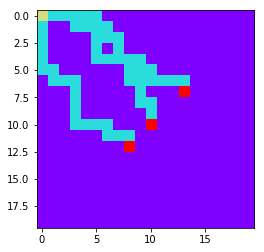

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.imshow(env.ground_truth, 'rainbow', interpolation='nearest')
#plt.savefig('ground_truth.png')

# Q関数をQ-learningで学習する

In [4]:
import numpy as np

#  state value更新回数
mc_step = 300000

# 割引率
gamma = 1. - 1. / float(nb_step)

# 学習率
learning_rate = 0.25

# 考えうる状態の数はground_truthの大きさと同じ（もう少し小さいが、面倒なので同じとする）
q_table = np.expand_dims(np.zeros_like(env.ground_truth, dtype=float), -1)
q_table = np.concatenate((q_table,q_table), -1)

# ゴール到達後のstate valueの保存間隔
#save_interval = 10000
save_interval = 1000

# ε-greedyのハイパーパラメータ
#epsilon = 0.1
epsilon = 0.3


In [5]:
from tqdm import tqdm

stacked_q_table = []
isSuccessed = False

#q_table = np.zeros_like(q_table) # state valueの初期化（念のためループ直前でも初期化する）
rnd = np.random.normal(loc=0., scale=0.1, size=q_table.shape)
q_table = rnd*(rnd>0)*(rnd<0.3)
try:
    count = 0
    for i in tqdm(range(mc_step)):
        # 状態の初期化
        current_state  = np.zeros(2, dtype=int)

        status = 0
        while status >= 0:
            # Q関数が最大になる行動を取る（まだ遷移させない）。
            if np.random.random(1) > epsilon:
                action = np.eye(2)[q_table[current_state[0], current_state[1], :].argmax()].astype(int)
            else:
                action = env.random_action()

            # 行動に対する報酬と遷移後の状態の計算
            next_state, reward, status = env.do_action(current_state, action)
            
            if status==1:
                isSuccessed = True

            if status>=0:
                # TD誤差の計算
                q_current = q_table[current_state[0], current_state[1], action.argmax()]
                q_next_max = np.array(q_table[next_state[0], next_state[1],:]).max()
                td_error = reward + gamma * q_next_max - q_current

                # Q関数の更新
                q_table[current_state[0], current_state[1], action.argmax()] = q_current + learning_rate * td_error

                # 状態の遷移（マス目の移動）
                current_state = next_state
                
                if isSuccessed:
#                if True:
                    count += 1
                    if count==save_interval:
                        stacked_q_table.append(np.copy(q_table))
                        count = 0
            
except Exception:
    pass

100%|██████████| 300000/300000 [00:31<00:00, 9457.02it/s] 


# 学習過程の可視化
- TD学習では一度ゴールまでたどり着くとその後常にstate valueが更新される。

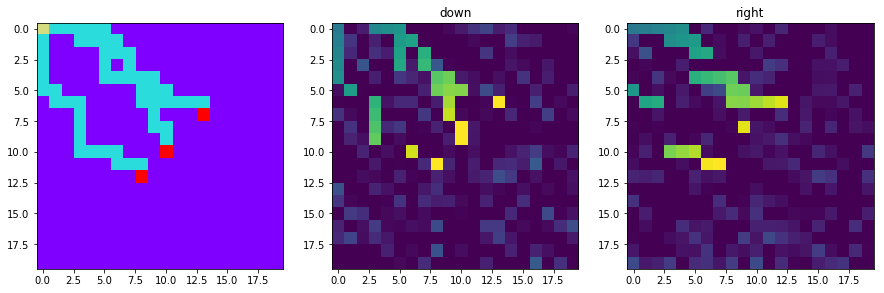

In [6]:
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(env.ground_truth, 'rainbow', interpolation='nearest')

plt.subplot(1,3,2)
plt.imshow(q_table[:,:,0], interpolation='nearest')
plt.clim(0,1)
plt.title('down')

plt.subplot(1,3,3)
plt.imshow(q_table[:,:,1], interpolation='nearest')
plt.clim(0,1)
plt.title('right')

In [7]:
len(stacked_q_table)

1798

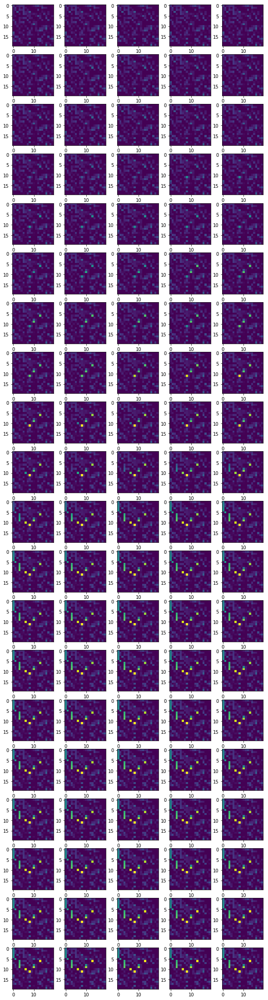

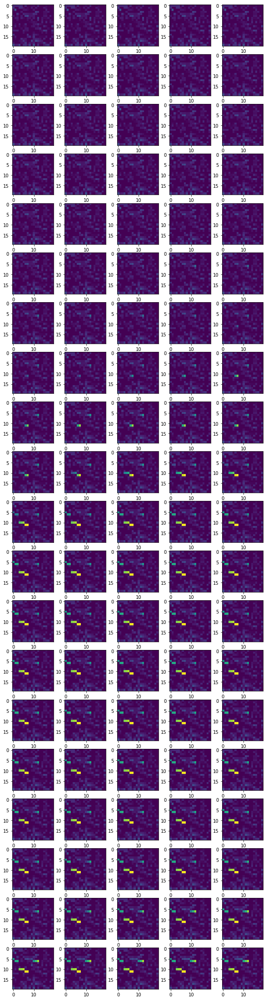

In [8]:
if isSuccessed:
    nb_show = 100
    nb = 0
    plt.figure(figsize=(10,10*int(len(stacked_q_table[:nb_show])+1)/5.))
    for v in stacked_q_table[:nb_show]:
        nb += 1
        plt.subplot(int(len(stacked_q_table[:nb_show])+1),5,nb)
        plt.imshow(v[:,:,0], interpolation='nearest')
        plt.clim(0,1)
    plt.show()
    
    plt.figure(figsize=(10,10*int(len(stacked_q_table[:nb_show])+1)/5.))
    for v in stacked_q_table[:nb_show]:
        nb += 1
        plt.subplot(int(len(stacked_q_table[:nb_show])+1),5,nb)
        plt.imshow(v[:,:,1], interpolation='nearest')
        plt.clim(0,1)


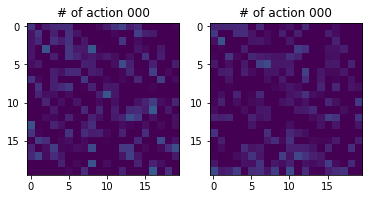

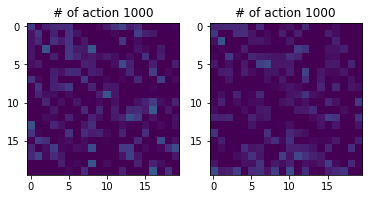

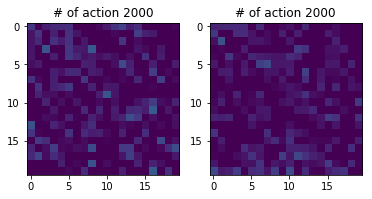

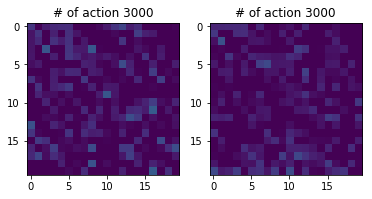

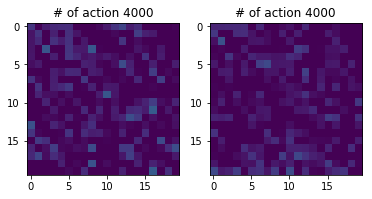

...

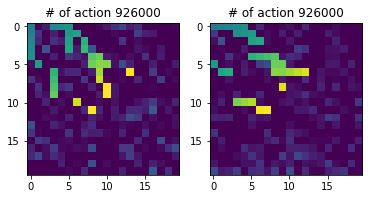

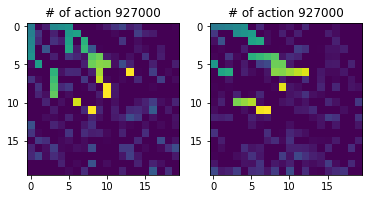

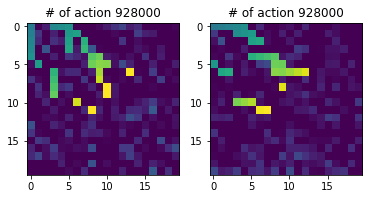

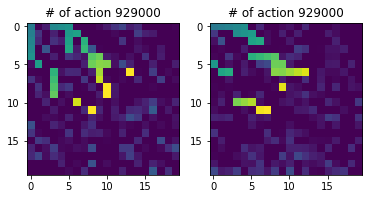

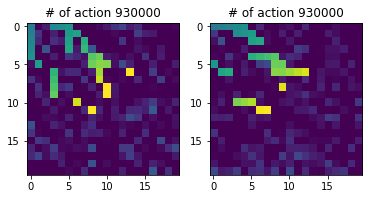

/Users/ruhokondo/Programming/anaconda3/envs/dl/lib/python3.6/site-packages/matplotlib/axis.py:1035: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


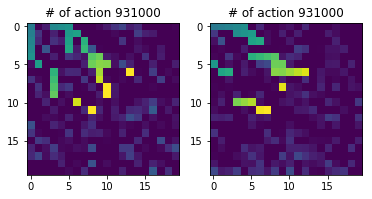

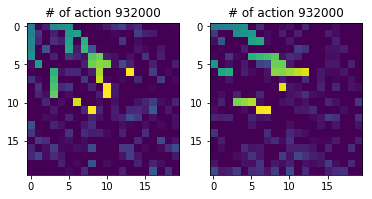

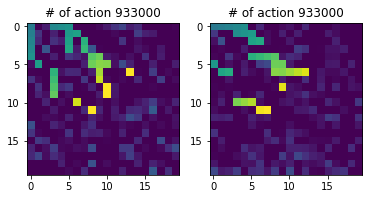

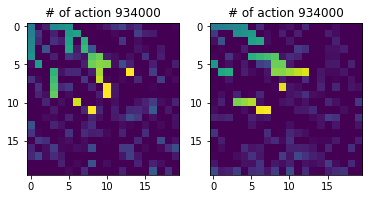

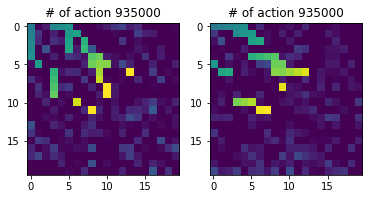

...

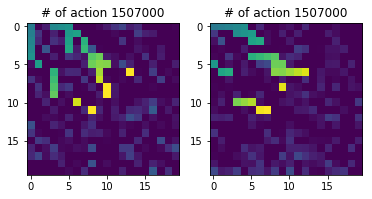

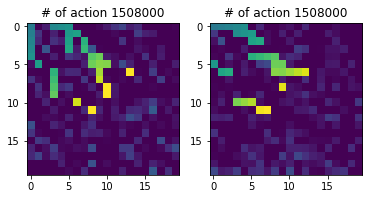

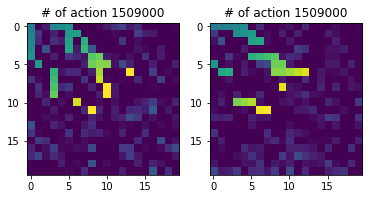

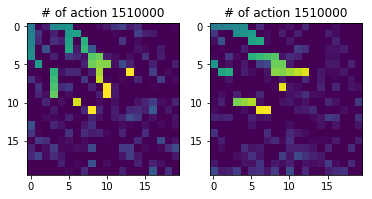

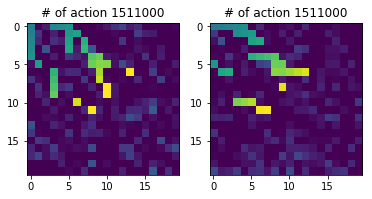

KeyboardInterrupt: 

In [9]:
for i,v in enumerate(stacked_q_table[:200]):
    plt.subplot(1,2,1)
    plt.imshow(v[:,:,0], interpolation='nearest')
    plt.clim(0,1)
    plt.title('# of action '+str(i*save_interval).zfill(3))
    plt.subplot(1,2,2)
    plt.imshow(v[:,:,1], interpolation='nearest')
    plt.clim(0,1)
    plt.title('# of action '+str(i*save_interval).zfill(3))
    plt.savefig('q_iter_'+str(i).zfill(4)+'.png')
    plt.show()